# GEOG5990M Final Assignment (Template)

Student ID number: 201885724

In [ ]:
# read in required packages

In [2]:
!pip install contextily
!pip install geoplot
!pip install git+https://github.com/pmdscully/geo_northarrow.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 87.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 41.6 MB/s eta 0:00:00
  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-gnwu0wf7
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-gnwu0wf7
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for geo_northarrow: filename=geo_northarrow-0.2.0a0-py3-none-any.whl size=14724 sha256=7234ee6b65f8151e1249473bf20b72e87e816c3b2253de5decfc0cb3c56ac615
  Stored in directory: /tmp/pip-ephem-wheel-cache-gufi5fvt/wheels/6a/22/96/2e5d1215f457d6b69b44cbaa1a0d3b822bc656dcabcda80095
Succe

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import geopandas as gpd
import pyproj
import contextily as ctx
import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow

This is an example block of mardown text I want to reference <a href="#ref1">[1]</a>. I might need to add some more citations <a href="#ref2">[2]</a><a href="#ref2">[3]</a>



## Data Import and Description

This project investigates the spatial relationship between deprivation levels and healthcare facility accessibility across different areas of Leeds.

The following datasets were imported:

- **Index of Multiple Deprivation (IMD) 2019** [1]
  - Source: UK Government  
  - Spatial Resolution: LSOA (2011 boundaries)  
  - Description: Composite index measuring area-level deprivation across multiple domains.  

- **Health Domain Score (Access to Healthy Assets & Hazards (AHAH) v3)** [2]
  - Source: Consumer Data Research Centre (CDRC)  
  - Spatial Resolution: LSOA (2011 boundaries)  
  - Description: Composite indicator reflecting the accessibility of  health-promoting environments.
  - Reason for Use: Consistent with the LSOA boundaries used in IMD datasets.

- **Leeds Administrative Boundary (2011)** [3]
  - Source: Office for National Statistics (ONS)
  - Reason for Use: Consistent with the LSOA boundaries used in IMD and AHAH datasets.

- **Healthcare Facilities Locations (Hospitals, Dentists, General Practitioners, Pharmacies)**  
  - Source: Open Street Map  
  - Description: Geographical point data representing the locations of key healthcare facilities in Leeds.

*Note: The 2011 LSOA boundaries were used throughout this analysis to ensure spatial consistency between datasets.*


In [6]:
# Read IMD data and perform basic checks
IMD_2019=pd.read_csv("https://github.com/Liwen-Jia/GEOG5990M/raw/refs/heads/main/imd_2019.csv")
IMD_2019.head()

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Score,Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Score (rate),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),...,Indoors Sub-domain Rank (where 1 is most deprived),Indoors Sub-domain Decile (where 1 is most deprived 10% of LSOAs),Outdoors Sub-domain Score,Outdoors Sub-domain Rank (where 1 is most deprived),Outdoors Sub-domain Decile (where 1 is most deprived 10% of LSOAs),Total population: mid 2015 (excluding prisoners),Dependent Children aged 0-15: mid 2015 (excluding prisoners),Population aged 16-59: mid 2015 (excluding prisoners),Older population aged 60 and over: mid 2015 (excluding prisoners),Working age population 18-59/64: for use with Employment Deprivation Domain (excluding prisoners)
0,E01000001,City of London 001A,E09000001,City of London,6.208,29199,9,0.007,32831,10,...,16364,5,1.503,1615,1,1296,175,656,465,715
1,E01000002,City of London 001B,E09000001,City of London,5.143,30379,10,0.034,29901,10,...,22676,7,1.196,2969,1,1156,182,580,394,620
2,E01000003,City of London 001C,E09000001,City of London,19.402,14915,5,0.086,18510,6,...,17318,6,2.207,162,1,1350,146,759,445,804
3,E01000005,City of London 001E,E09000001,City of London,28.652,8678,3,0.211,6029,2,...,25218,8,1.769,849,1,1121,229,692,200,683
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,19.837,14486,5,0.117,14023,5,...,14745,5,0.969,4368,2,2040,522,1297,221,1285


In [7]:
# Read AHAH data and perform basic checks
AH4H=pd.read_csv("https://github.com/Liwen-Jia/GEOG5990M/raw/refs/heads/main/ahah_v3.csv")
AH4H.head()

,lsoa11,ahah,ahah_rnk,ahah_pct,h,gp,dent,phar,hosp
0,E01000001,64.766722,41700,100,-2.094345,2.106000,0.4000,0.561600,0.492000
1,E01000002,65.801756,41703,100,-1.192991,3.146895,0.8875,0.879179,1.448895
2,E01000003,64.267360,41695,100,-2.590539,1.151000,0.0000,0.347500,0.649500
3,E01000005,67.739216,41710,100,-1.632323,1.462800,0.5650,0.942600,1.224050
4,E01000006,42.072046,40256,97,-0.739518,1.585000,2.1500,1.867500,1.585000


In [8]:
# Read Leeds LSOA data and perform basic checks
leeds=gpd.read_file('https://github.com/Liwen-Jia/GEOG5990M/raw/refs/heads/main/Leeds_LSOA.geojson')
leeds.head()

,FID,LSOA11CD,LSOA11NM,area,geometry
0,0,E01032504,Leeds 007F,297.418060,"POLYGON ((426573.188 441718.812, 426616.313 44..."
1,1,E01032502,Leeds 017F,45.052171,"POLYGON ((424841.601 438532.716, 424845.813 43..."
2,2,E01032503,Leeds 007E,1285.020020,"POLYGON ((424881 443639, 424881.262 443640.345..."
3,3,E01032500,Leeds 067H,14.072231,"POLYGON ((426585 433610, 426586.071 433608.036..."
4,4,E01032501,Leeds 017E,24.600637,"POLYGON ((424473.001 439078, 424478 439070.999..."


In [9]:
# Reads Leeds healthcare facility location data and performs basic checks
leeds_healthcare=gpd.read_file('https://github.com/Liwen-Jia/GEOG5990M/raw/refs/heads/main/leeds_health_facilities.geojson')
leeds_healthcare.head()

,name,amenity,lat,lon,geometry
0,Harewood Surgery,doctors,53.900523,-1.512427,POINT (-1.51243 53.90052)
1,Unknown,pharmacy,53.814218,-1.629035,POINT (-1.62904 53.81422)
2,Well Pharmacy,pharmacy,53.812073,-1.626799,POINT (-1.6268 53.81207)
3,Well Burley - Burley Road,pharmacy,53.807632,-1.579994,POINT (-1.57999 53.80763)
4,Well Pharmacy,pharmacy,53.818649,-1.583360,POINT (-1.58336 53.81865)


## 2. Data Cleaning and Preparation

### 2.1 Checking Data Integrity

Before conducting the analysis, all datasets were checked for missing values, incorrect data types, and inconsistencies in spatial reference systems. Ensuring that all datasets use the same spatial resolution (2011 LSOA boundaries) and coordinate reference system is critical for accurate spatial analysis.

In [10]:
# View IMD data information
IMD_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32844 entries, 0 to 32843
Data columns (total 57 columns):
 #   Column                                                                                              Non-Null Count  Dtype  
---  ------                                                                                              --------------  -----  
 0   LSOA code (2011)                                                                                    32844 non-null  object 
 1   LSOA name (2011)                                                                                    32844 non-null  object 
 2   Local Authority District code (2019)                                                                32844 non-null  object 
 3   Local Authority District name (2019)                                                                32844 non-null  object 
 4   Index of Multiple Deprivation (IMD) Score                                                           32844 non-nu

In [11]:
# View health domain score data information
AH4H.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41729 entries, 0 to 41728
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lsoa11    41729 non-null  object 
 1   ahah      41729 non-null  float64
 2   ahah_rnk  41729 non-null  int64  
 3   ahah_pct  41729 non-null  int64  
 4   h         41729 non-null  float64
 5   gp        41729 non-null  float64
 6   dent      41729 non-null  float64
 7   phar      41729 non-null  float64
 8   hosp      41729 non-null  float64
dtypes: float64(6), int64(2), object(1)
memory usage: 2.9+ MB


In [12]:
# Check if leeds IOSA data is working
leeds.explore()

In [13]:
# Check if Leeds healthcare facility location data is working
leeds_healthcare.explore()

In [14]:
# Check the CRS are the same
print(leeds.crs, leeds_healthcare.crs)

EPSG:27700 EPSG:4326


In [15]:
# Projection conversion
leeds_healthcare_27700 = leeds_healthcare.to_crs(epsg=27700)
print(leeds.crs, leeds_healthcare_27700.crs)

EPSG:27700 EPSG:27700


### 2.2 Merging Datasets

The IMD scores and health domain scores were merged and Leeds area data extracted based on the LSOA code to create a unified dataset.

In [16]:
# Merging IMD score and health domain score data
health=IMD_2019.merge(AH4H, how='left', left_on='LSOA code (2011)', right_on='lsoa11')
health.head()

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Score,Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Score (rate),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),...,Working age population 18-59/64: for use with Employment Deprivation Domain (excluding prisoners),lsoa11,ahah,ahah_rnk,ahah_pct,h,gp,dent,phar,hosp
0,E01000001,City of London 001A,E09000001,City of London,6.208,29199,9,0.007,32831,10,...,715,E01000001,64.766722,41700,100,-2.094345,2.106000,0.4000,0.561600,0.492000
1,E01000002,City of London 001B,E09000001,City of London,5.143,30379,10,0.034,29901,10,...,620,E01000002,65.801756,41703,100,-1.192991,3.146895,0.8875,0.879179,1.448895
2,E01000003,City of London 001C,E09000001,City of London,19.402,14915,5,0.086,18510,6,...,804,E01000003,64.267360,41695,100,-2.590539,1.151000,0.0000,0.347500,0.649500
3,E01000005,City of London 001E,E09000001,City of London,28.652,8678,3,0.211,6029,2,...,683,E01000005,67.739216,41710,100,-1.632323,1.462800,0.5650,0.942600,1.224050
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,19.837,14486,5,0.117,14023,5,...,1285,E01000006,42.072046,40256,97,-0.739518,1.585000,2.1500,1.867500,1.585000


In [17]:
# Extraction of Leeds region data
health_leeds=leeds.merge(health, how='left', left_on='LSOA11CD', right_on='lsoa11')
health_leeds.head()

,FID,LSOA11CD,LSOA11NM,area,geometry,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Score,...,Working age population 18-59/64: for use with Employment Deprivation Domain (excluding prisoners),lsoa11,ahah,ahah_rnk,ahah_pct,h,gp,dent,phar,hosp
0,0,E01032504,Leeds 007F,297.418060,"POLYGON ((426573.188 441718.812, 426616.313 44...",E01032504,Leeds 007F,E08000035,Leeds,3.599,...,767,E01032504,10.438319,1940,5,0.258838,2.2948,9.3605,2.8800,2.2948
1,1,E01032502,Leeds 017F,45.052171,"POLYGON ((424841.601 438532.716, 424845.813 43...",E01032502,Leeds 017F,E08000035,Leeds,37.513,...,1060,E01032502,18.308166,17471,42,0.123271,4.6325,2.7170,3.9235,3.7810
2,2,E01032503,Leeds 007E,1285.020020,"POLYGON ((424881 443639, 424881.262 443640.345...",E01032503,Leeds 007E,E08000035,Leeds,8.849,...,769,E01032503,15.523183,10876,27,0.733341,5.8263,11.6887,4.0285,3.9808
3,3,E01032500,Leeds 067H,14.072231,"POLYGON ((426585 433610, 426586.071 433608.036...",E01032500,Leeds 067H,E08000035,Leeds,49.590,...,821,E01032500,29.124074,34386,83,-0.927717,1.9775,1.0812,1.0812,1.7150
4,4,E01032501,Leeds 017E,24.600637,"POLYGON ((424473.001 439078, 424478 439070.999...",E01032501,Leeds 017E,E08000035,Leeds,9.184,...,604,E01032501,22.057037,25295,61,0.041092,4.8435,2.0470,3.8185,3.8185


In [41]:
# Simplified forms
health_leeds_final=health_leeds[['LSOA11CD', 'Index of Multiple Deprivation (IMD) Score', 'h', 'geometry']]
health_leeds_final=health_leeds_final.rename(columns={'Index of Multiple Deprivation (IMD) Score': 'IMD_Score','h': 'Health_Score'})
health_leeds_final.head()

,LSOA11CD,IMD_Score,Health_Score,geometry
0,E01032504,3.599,0.258838,"POLYGON ((426573.188 441718.812, 426616.313 44..."
1,E01032502,37.513,0.123271,"POLYGON ((424841.601 438532.716, 424845.813 43..."
2,E01032503,8.849,0.733341,"POLYGON ((424881 443639, 424881.262 443640.345..."
3,E01032500,49.590,-0.927717,"POLYGON ((426585 433610, 426586.071 433608.036..."
4,E01032501,9.184,0.041092,"POLYGON ((424473.001 439078, 424478 439070.999..."


In [19]:
# Confirm the integrity of the merged data
health_leeds_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 482 entries, 0 to 481
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LSOA11CD      482 non-null    object 
 1   IMD_Score     482 non-null    float64
 2   Health_Score  482 non-null    float64
dtypes: float64(2), object(1)
memory usage: 11.4+ KB


### 2.3 Outlier Detection and Variable Transformation

Exploratory data analysis was performed to identify potential outliers using descriptive statistics and boxplots. Where appropriate, variables were standardized to allow for meaningful comparisons across different measurement scales, particularly during regression analysis.

In [20]:
# Identifying potential outliers in IMD scores using descriptive statistics
health_leeds_final['IMD_Score'].describe()

,IMD_Score
count,482.000000
mean,27.243361
std,19.336698
min,2.022000
25%,11.471000
50%,20.025500
75%,41.773000
max,78.577000


In [21]:
# Identifying potential outliers in health domain scores using descriptive statistics
health_leeds_final['Health_Score'].describe()

,Health_Score
count,482.000000
mean,-0.382969
std,0.671024
min,-3.379653
25%,-0.805608
50%,-0.383181
75%,0.047547
max,1.580431


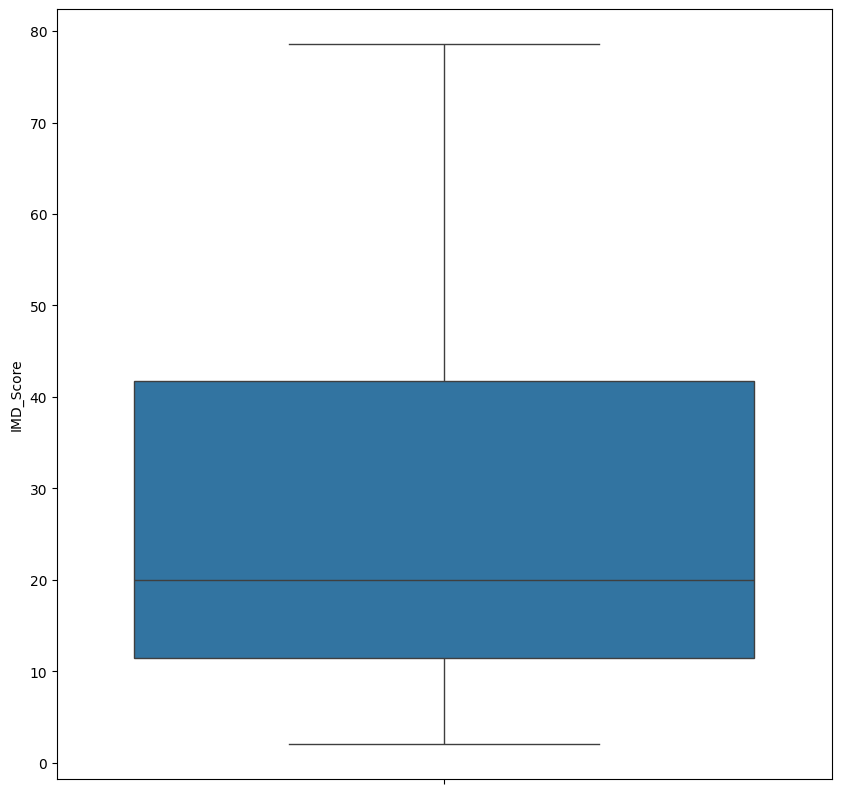

In [22]:
# Identifying potential outliers in IMD scores using boxplot
plt.figure(figsize=(10,10))
sns.boxplot(data=health_leeds_final, y='IMD_Score');

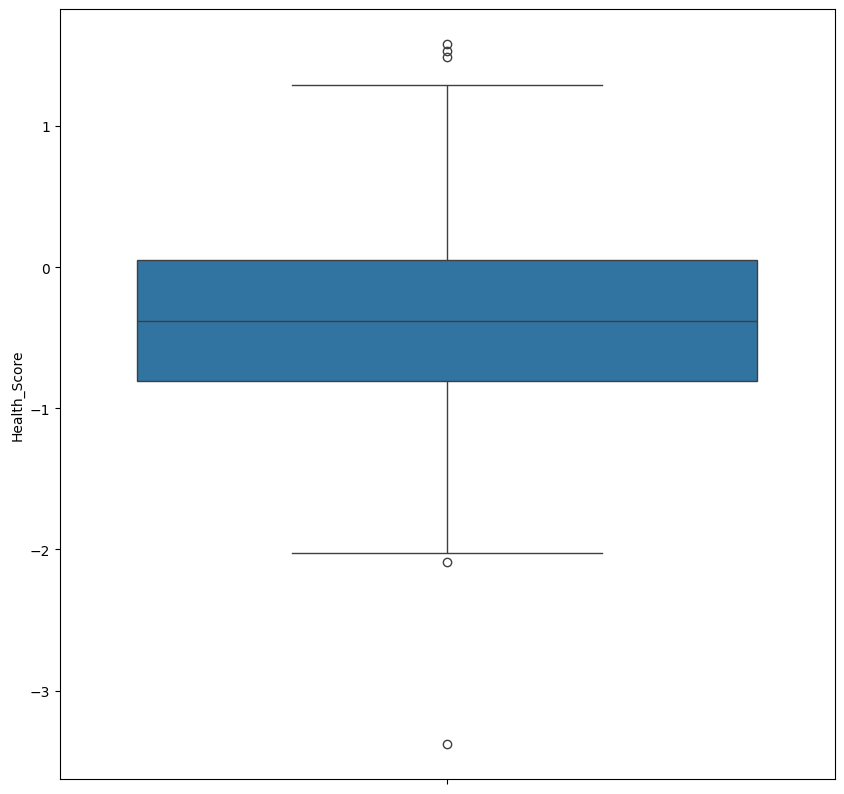

In [23]:
# Identifying potential outliers in health domain scores using boxplot
plt.figure(figsize=(10,10))
sns.boxplot(data=health_leeds_final, y='Health_Score');

In [42]:
# Standardised variables
health_leeds_final['IMD_Score_norm'] = (health_leeds_final['IMD_Score'] - health_leeds_final['IMD_Score'].min()) / (health_leeds_final['IMD_Score'].max() - health_leeds_final['IMD_Score'].min())
health_leeds_final['Health_Score_norm'] = (health_leeds_final['Health_Score'] - health_leeds_final['Health_Score'].min()) / (health_leeds_final['Health_Score'].max() - health_leeds_final['Health_Score'].min())
health_leeds_final.head()

,LSOA11CD,IMD_Score,Health_Score,geometry,IMD_Score_norm,Health_Score_norm
0,E01032504,3.599,0.258838,"POLYGON ((426573.188 441718.812, 426616.313 44...",0.020600,0.733554
1,E01032502,37.513,0.123271,"POLYGON ((424841.601 438532.716, 424845.813 43...",0.463601,0.706223
2,E01032503,8.849,0.733341,"POLYGON ((424881 443639, 424881.262 443640.345...",0.089178,0.829219
3,E01032500,49.590,-0.927717,"POLYGON ((426585 433610, 426586.071 433608.036...",0.621357,0.494334
4,E01032501,9.184,0.041092,"POLYGON ((424473.001 439078, 424478 439070.999...",0.093554,0.689655


### 2.4 Spatial Joining

Healthcare facility data were spatially joined with LSOA boundaries to provide an indicator of healthcare accessibility.


In [39]:
# Spatially joining healthcare facility data with LOSA data
leeds_healthcare_joined = gpd.sjoin(leeds_healthcare_27700, leeds, how="inner", predicate='intersects')
leeds_healthcare_joined.head()

,name,amenity,lat,lon,geometry,index_right,FID,LSOA11CD,LSOA11NM,area
0,Harewood Surgery,doctors,53.900523,-1.512427,POINT (432134.754 445038.398),241,241,E01011561,Leeds 006A,2551.487166
1,Unknown,pharmacy,53.814218,-1.629035,POINT (424522.951 435389.735),287,287,E01011331,Leeds 058A,22.505799
2,Well Pharmacy,pharmacy,53.812073,-1.626799,POINT (424671.455 435151.854),280,280,E01011336,Leeds 058C,30.187856
3,Well Burley - Burley Road,pharmacy,53.807632,-1.579994,POINT (427756.32 434674.981),106,106,E01011483,Leeds 056E,31.067724
4,Well Pharmacy,pharmacy,53.818649,-1.583360,POINT (427527.411 435899.398),360,360,E01032945,Leeds 044F,30.921237


Data Visualisation
- Don't forget to present your final two data visualisation (one spatial and one non-spatial) and the justifications about the decisions you made whilst preparing and visualising the data.

### Non-Spatial Visualization: IMD vs Health Accessibility  

**Intended Audience**: Policymakers and Public Health Planners  

**Design Choices**:  
- A scatter plot was chosen to visualize the relationship between standardized deprivation scores and health environment accessibility across LSOAs.  
- A regression line is included to highlight the observed trend, which shows that areas with higher deprivation tend to have *better accessibility to health-promoting environments*.  
- This counterintuitive finding reflects the urban spatial structure of Leeds, where more deprived areas are often located closer to city centers and public amenities, increasing their physical accessibility to health-promoting facilities. However, it is important to note that higher accessibility does not necessarily translate into better health outcomes.  
- Variables were standardized to ensure comparability and improve the interpretability of the regression slope.  
- A color-blind friendly palette (`seaborn` colorblind palette[4]) was used following best practices in accessible data visualization, and clear axis labels were applied to ensure readability for diverse audiences, including non-technical stakeholders.
  
The scatter plot was selected based on its effectiveness in illustrating relationships between two continuous variables, allowing policymakers to easily interpret the correlation between deprivation and health-promoting environment accessibility. The addition of a regression line facilitates a quick understanding of the overall trend without requiring detailed statistical knowledge [5]. The decision to standardize variables was guided by recommendations for improving comparability across different measurement scales.

Alternative visualizations such as boxplots or bar charts were considered but deemed less effective for communicating continuous relationships and trends. Scatter plots are particularly recommended for public health data where understanding both variance and trend direction is essential.

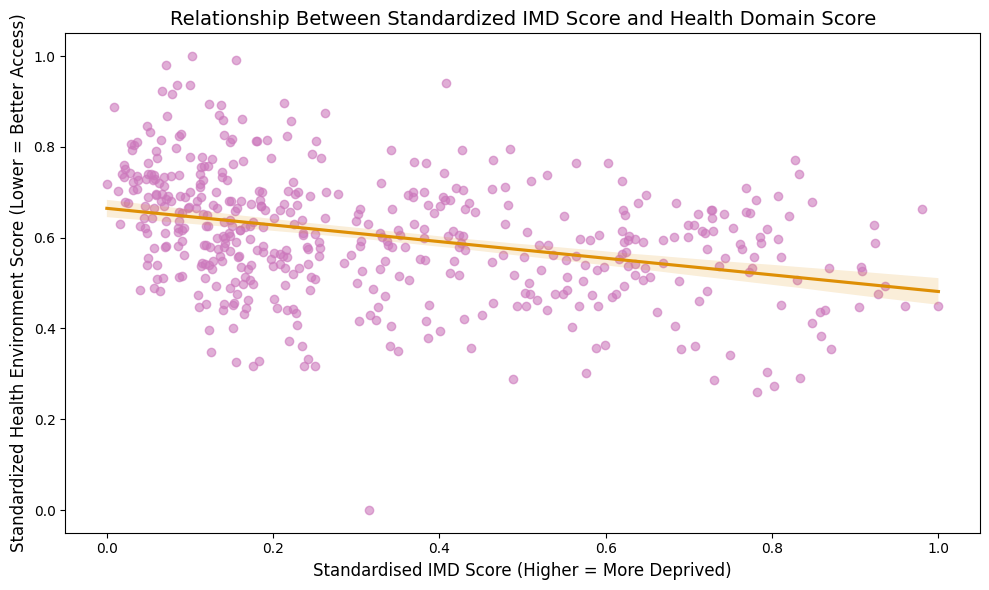

In [83]:
plt.figure(figsize=(10, 6))
# Creating Regplot
sns.regplot(
    data=health_leeds_final,
    x='IMD_Score_norm',
    y='Health_Score_norm',
    scatter_kws={'alpha':0.6,'color': sns.color_palette("colorblind")[4]},
    line_kws={'color': sns.color_palette("colorblind")[1]})

# Modifying chart titles and labels
plt.title('Relationship Between Standardized IMD Score and Health Domain Score', fontsize=14)
plt.xlabel('Standardised IMD Score (Higher = More Deprived)', fontsize=12)
plt.ylabel('Standardized Health Environment Score (Lower = Better Access)', fontsize=12)
plt.tight_layout()
plt.show()

**Model Interpretation and Justification**:

A simple linear regression model was applied to explore the relationship between standardized IMD scores and health environment accessibility. The model revealed a *statistically significant negative relationship*, indicating that higher deprivation is associated with greater accessibility to health-promoting environments within the Leeds area. This suggests that deprived communities are often located closer to urban centers where such facilities are concentrated. However, it is important to emphasize that this relationship reflects *physical accessibility* rather than actual health behaviors or outcomes.

The linear regression model was chosen for its simplicity and effectiveness in explaining direct linear relationships between continuous variables. Given the exploratory nature of this analysis and the need to provide clear, interpretable results to non-technical stakeholders, linear regression is appropriate and sufficient. More complex models such as multivariate regression or spatial regression were considered but deemed unnecessary for this initial high-level policy insight. Additionally, the linear model allows for easy visualization of trends, aligning with the project’s focus on accessible and actionable communication of results.



### Spatial Visualization: IMD Scores and Healthcare Facility Locations in Leeds  

**Intended Audience**: Healthcare Service Planners and Local Policymakers  

**Design Choices**:  
- A **choropleth map** was used to visualize the spatial distribution of deprivation levels (IMD Scores) across Leeds at the LSOA level. This enables planners to easily identify areas with higher levels of deprivation, which are visualized using a red gradient to draw immediate attention to priority areas.  
- The **'YlOrRd' color scheme** from ColorBrewer was selected due to its proven effectiveness in thematic mapping and compatibility with color-blind audiences, ensuring critical information remains accessible.  
- Healthcare facilities, including hospitals, general practitioners (GPs), dentists, and pharmacies, were overlaid as point markers to visualize the spatial availability of health services relative to deprivation levels.  
- A **color-blind friendly palette** from the `seaborn` library was applied to facility points to maintain accessibility and improve visual clarity.  
- Map elements such as axis ticks were removed to reduce clutter and improve readability, following best practices for clear cartographic communication.  

While this visualization highlights the concentration of healthcare facilities across Leeds, it also reveals that some highly deprived areas have relatively good physical access to health services. This suggests that despite high deprivation, proximity to healthcare facilities does not necessarily equate to improved health outcomes, underlining the importance of considering both accessibility and actual service utilization in policy planning.
  
The choropleth map was selected as it effectively communicates spatial variation in deprivation across small geographic units, enabling policymakers to visually assess and prioritize intervention areas. The choice of a sequential color scheme (red gradient) intuitively draws attention to areas of higher deprivation, aligning with perceptual color design principles that emphasize critical regions. Overlaying healthcare facility locations allows for immediate visual assessment of service distribution gaps and potential spatial mismatches between deprivation and healthcare access.  
  
Alternative visualizations such as heatmaps and dot density maps were considered but rejected. Heatmaps, while useful for density visualization, obscure the administrative boundaries necessary for policy-relevant spatial targeting. Dot density maps were less effective for representing deprivation intensity across defined LSOA boundaries. The choropleth map, complemented by point markers for healthcare facilities, provides a clear, policy-relevant visualization that balances geographic precision with interpretability.  


<ipython-input-81-b308d37e3b16>:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='lower left')


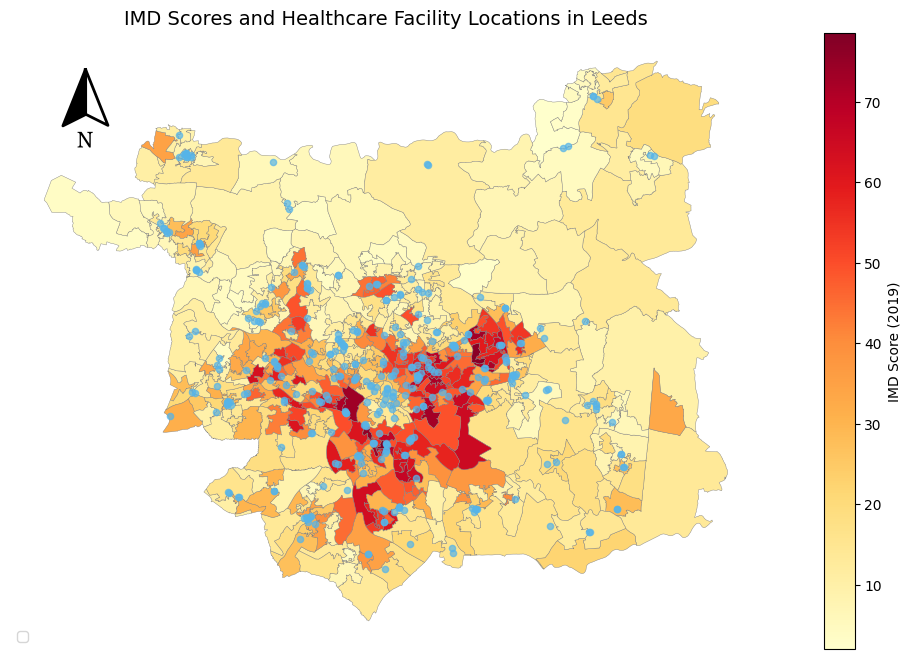

In [81]:
f,ax = plt.subplots(1, figsize=(16,8))

# Mapping IMD scores for different regions
base = health_leeds_final.plot(
    column='IMD_Score',
    cmap='YlOrRd',
    legend=True,
    legend_kwds={'label': "IMD Score (2019)", 'orientation': "vertical"},
    edgecolor='gray',
    linewidth=0.3,
    ax=ax
)

# Mapping the distribution of healthcare facilities
leeds_healthcare_joined.plot(
    ax=base,
    color=sns.color_palette("colorblind")[9],
    markersize=20,
    alpha=0.7)

# Modifying chart titles and labels
ax.set_title("IMD Scores and Healthcare Facility Locations in Leeds", fontsize=14)
ax.axis("off")
ax.legend(loc='lower left')
add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show()

## Conclusion

This study explored the spatial relationship between deprivation levels, health-promoting environment accessibility, and the distribution of healthcare facilities across Leeds. Through the integration of open spatial datasets and geospatial analysis, several key findings emerged:

- Areas with higher deprivation (as indicated by IMD scores) tend to have better **physical accessibility to health-promoting environments**. This result reflects the urban spatial structure of Leeds, where more deprived neighborhoods are often located near city centers, providing closer proximity to public amenities.  
- Despite this higher accessibility, health inequalities persist, suggesting that **physical proximity does not necessarily lead to improved health outcomes**. Barriers such as service affordability, cultural acceptability, personal health behaviors, and perceived safety may limit the effective utilization of available resources.  
- Spatial visualization further highlighted that some highly deprived areas, while geographically close to healthcare services, may still experience significant unmet health needs. This underscores the importance of addressing both **service accessibility and actual utilization** when formulating public health policies.

This research demonstrates how open spatial data and accessible analytical tools can provide valuable insights for targeted public health interventions, promoting more equitable resource distribution and contributing to improved population health outcomes.

## Limitations

While this study offers valuable insights into the spatial dynamics of deprivation and health resource accessibility, several limitations should be acknowledged:

- **Data Constraints**: To align with the 2019 census data, an older version of the LSOA boundaries was used. As a result, there may be some discrepancies between the spatial units used in this analysis and the current administrative boundaries.
- **Temporal Mismatch**: Although care was taken to use datasets based on 2011 LSOA boundaries, some datasets may not perfectly align temporally, potentially affecting the accuracy of spatial comparisons.  


## References

<p><a href="https://www.gov.uk/government/statistics/english-indices-of-deprivation-2019">[1]</a>English indices of deprivation 2019. (2019, September 26). GOV.UK. https://www.gov.uk/government/statistics/english-indices-of-deprivation-2019</p>
<p><a href="https://data.cdrc.ac.uk/dataset/access-healthy-assets-hazards-ahah-previous-versions">[2]</a>Access to Healthy Assets & Hazards (AHAH) (Previous versions) | CDRC Data. (n.d.). https://data.cdrc.ac.uk/dataset/access-healthy-assets-hazards-ahah-previous-versions</p>
<p><a href="https://geoportal.statistics.gov.uk/datasets/02e8d336d6804fbeabe6c972e5a27b16_0/explore?location=52.746511%2C-2.489527%2C6.70">[3]</a>Lower layer Super Output Areas (December 2011) Boundaries EW BGC (V3). (n.d.). https://geoportal.statistics.gov.uk/datasets/02e8d336d6804fbeabe6c972e5a27b16_0/explore?location=52.723753%2C-2.489527%2C6.70</p>
<p><a href="https://github.com/FrancescaPontin/GEOG5990">[4]</a>GEOG5990M course materials</p>
<p><a href="https://doi.org/10.1080/19315260.2016.1207967">[5]</a>Russo, V. M. (2016). The editor’s field – Regression/Correlation. International Journal of Vegetable Science, 22(4), 317–318. https://doi.org/10.1080/19315260.2016.1207967</p>